# CenterNet

**CenterNet** is an object detection model that prioritizes locating objects by predicting their center points and estimating associated bounding boxes. It offers a simplified yet effective approach to object detection, emphasizing accuracy and efficiency.

### Key Components

1. **Center Point Prediction:**
   - CenterNet predicts the center point of each object directly, generating a heatmap where high-value points correspond to estimated object centers.

2. **Bounding Box Regression:**
   - The model predicts the width and height of bounding boxes for each detected center point, eliminating the need for predefined anchor boxes.

3. **Objectness Score:**
   - An objectness score is predicted for each detected object, indicating the confidence of an object's presence at a specific location.

4. **Loss Function:**
   - CenterNet employs a combination of:
      - Focal loss for the heatmap.
      - L1 loss for bounding box regression.
      - Binary cross-entropy loss for the objectness score.

5. **Backbone Network:**
   - Various backbone networks, such as ResNet or Hourglass, can be used to extract features from the input image.

6. **Post-processing:**
   - Non-maximum suppression filters out redundant and overlapping predictions, retaining only the most confident and accurate detections.

### Advantages

- **Simplicity:** CenterNet simplifies object detection by directly predicting object centers, reducing the complexity associated with anchor box-based methods.

- **Accuracy:** It achieves high accuracy and competes favorably with state-of-the-art performance on object detection tasks.

- **Efficiency:** CenterNet maintains computational efficiency, making it suitable for real-time applications while delivering competitive performance.

In [2]:
!nvidia-smi

Thu Oct 12 10:34:55 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.12             Driver Version: 535.104.12   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A6000               On  | 00000000:19:00.0 Off |                  Off |
| 30%   39C    P8              27W / 300W |   7677MiB / 49140MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
!nvcc -V

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


### <em>Optional</em>
If you'd like to use a base a pretrained CenterNet, you can uncomment the following line code

and change `load_from` variable in the config file [centernet_hrplanesv2.py](./mmlab_configs/centernet_hrplanesv2.py) from `None` to the path of the downloaded `.pth`

I our case, pretrained ```centernet-update_r50-caffe_fpn_ms-1x_coco``` has been selected for this training.

In [4]:
# !mim download mmdet --config centernet-update_r50-caffe_fpn_ms-1x_coco --dest mmlab_configs

HOME: /home/safouane/Downloads/benchmark_aircraft


### Start training

you can start training Faster RCNN using this command line

In [5]:
!python train.py mmlab_configs/centernet_hrplanesv2.py

### Wait until the training finishes
if the training takes too long you can use in the terminal the command:

 ```nohup python train.py mmlab_configs/centernet_hrplanesv2.py > centernet_hrplanesv2.log &```

### Inference
To run the inference, execute the following command

In [1]:
!python image_inference.py inference_test/unseen output_tensor/centernet/centernet_hrplanesv2.py --weights output_tensor/centernet/best.pth --out-dir inference_test/results/centernet_inference --pred-score-thr 0.3

Loads checkpoint by local backend from path: output_tensor/centernet/best.pth
01/11 13:26:26 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.
01/11 13:26:26 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
/home/safouane/miniconda3/envs/openmmlab/lib/python3.8/site-packages/torch/funct━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━   
ional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be 
required to pass the indexing argument. (Triggered internally at 
/opt/conda/conda-bld/pytorch_1682343962757/work/aten/src/ATen/native/TensorShape
.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/safouane/.local/lib/pytho

### Let's plot the results

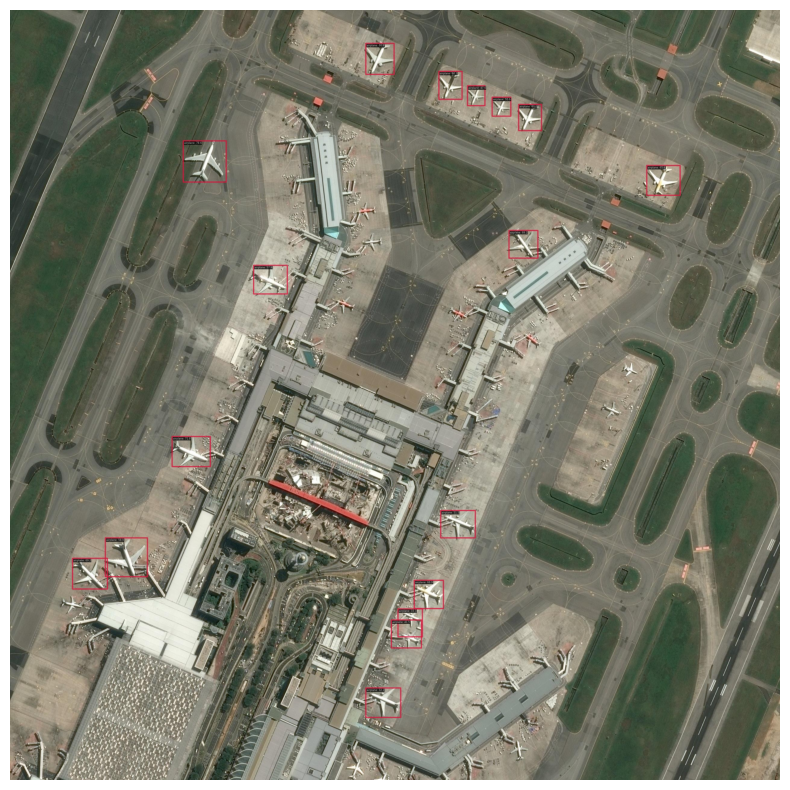

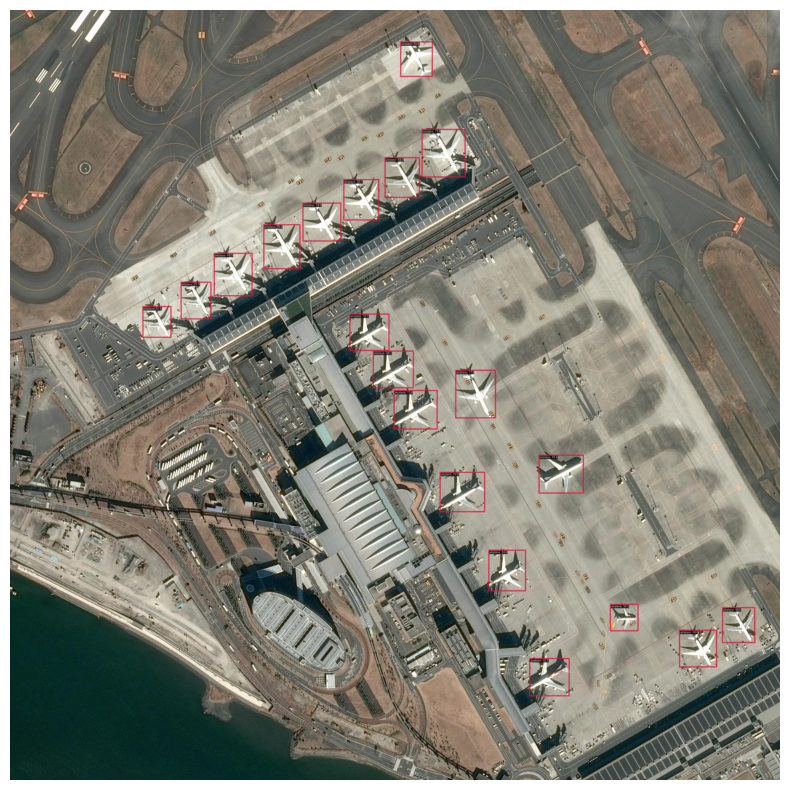

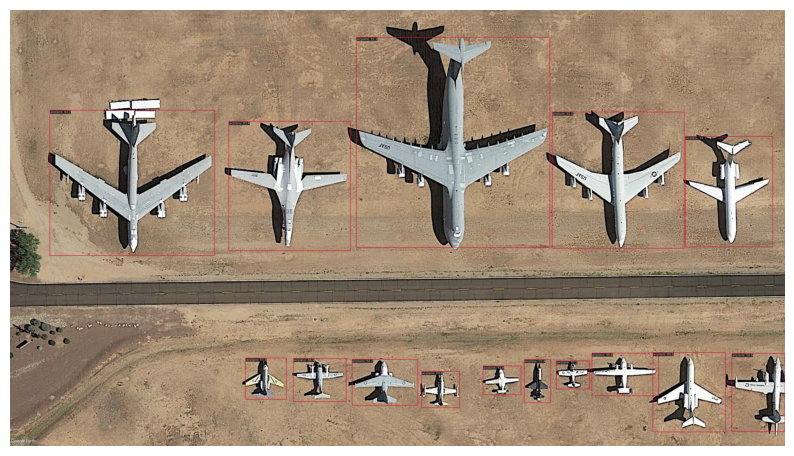

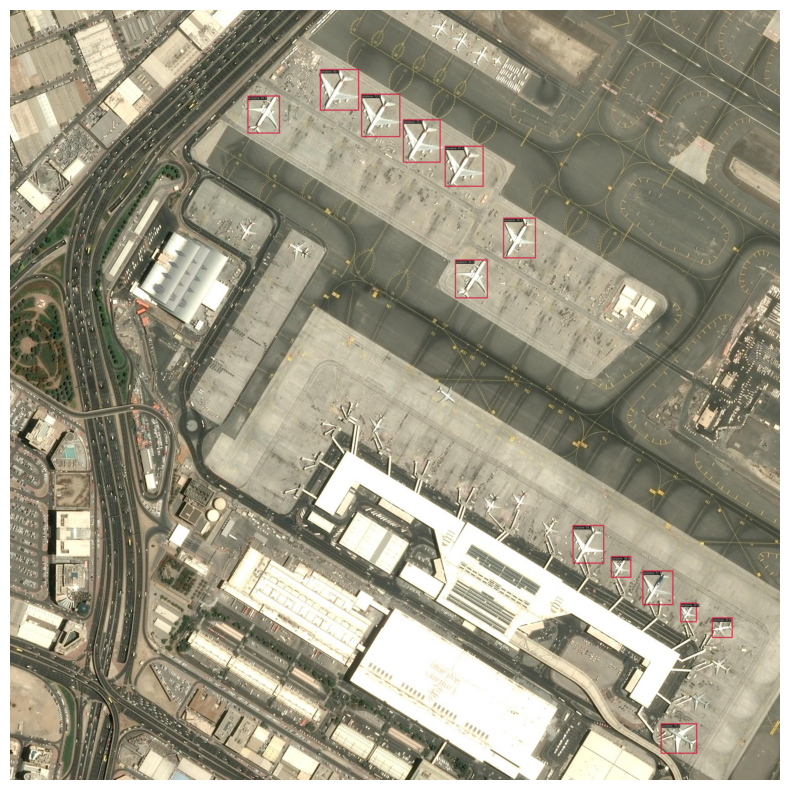

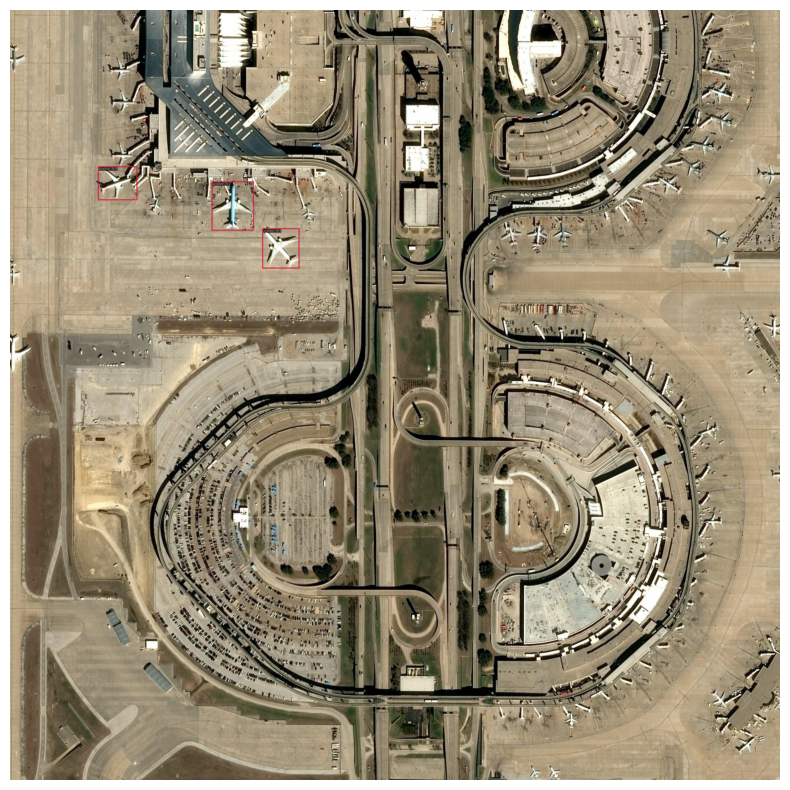

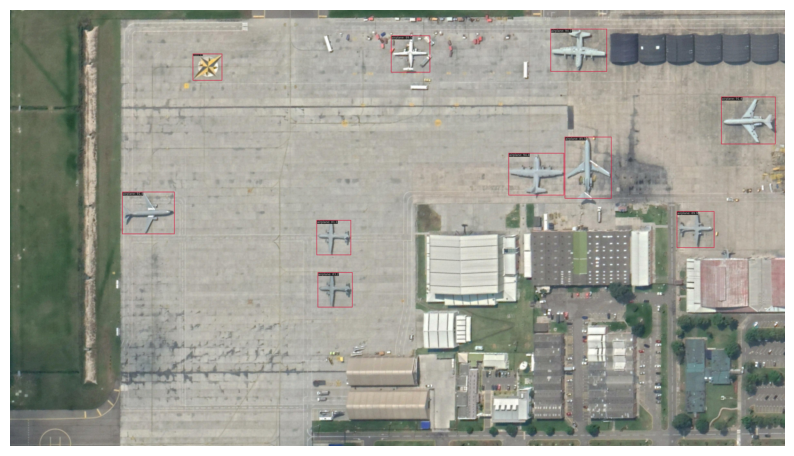

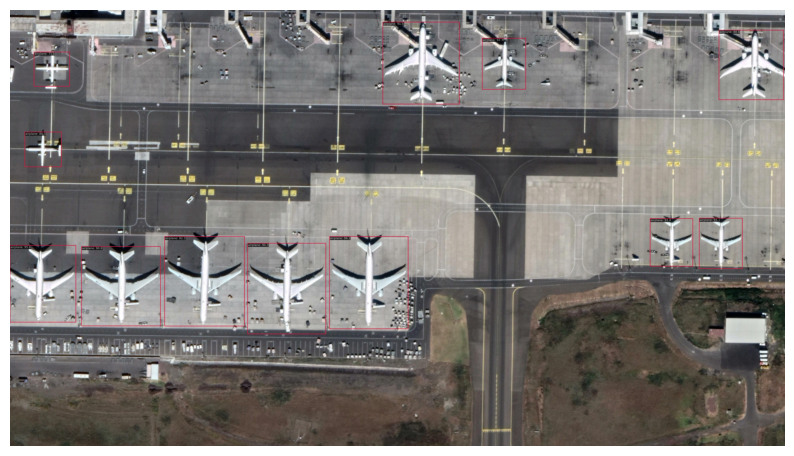

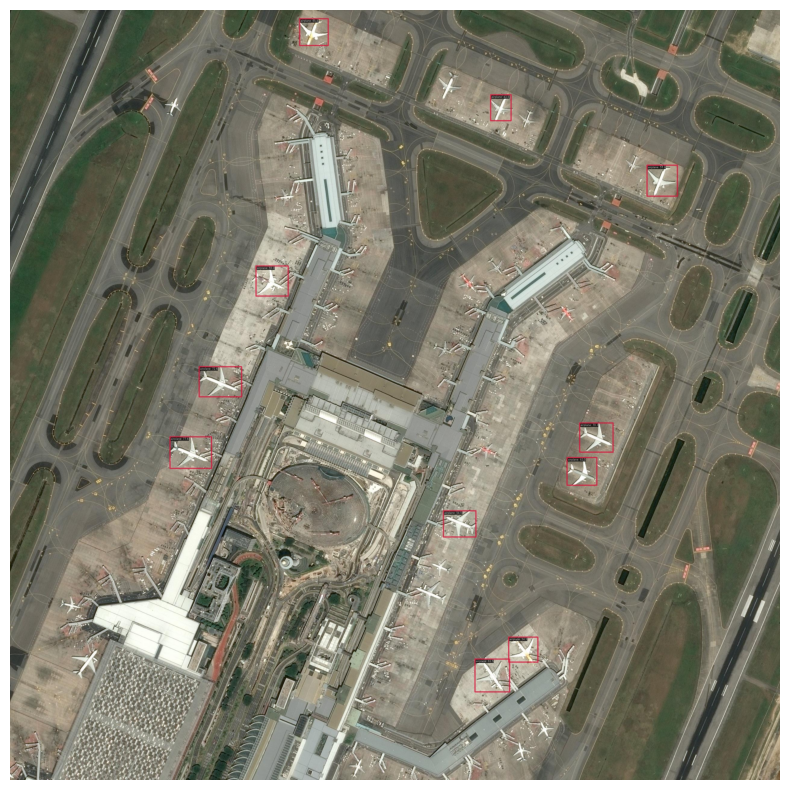

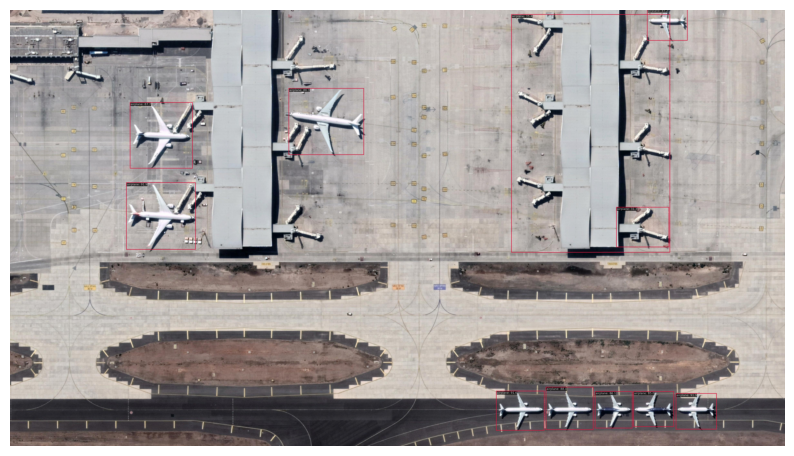

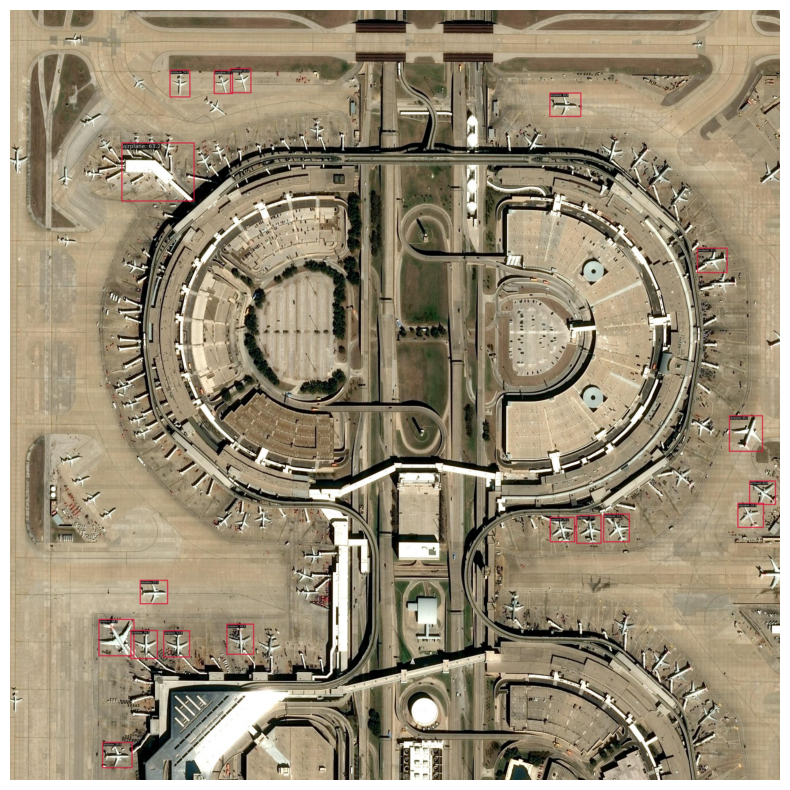

In [2]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define the path to the directory containing the jpg images
path_to_images = './inference_test/results/centernet_inference/vis'

# Iterate over each file in the directory
for file in os.listdir(path_to_images):
    # Check if the file is a jpg image
    if file.endswith('.jpg'):
        # Open the image using PIL
        img = Image.open(os.path.join(path_to_images, file))

        # Convert the image to an RGB format that matplotlib can understand
        img_rgb = img.convert('RGB')

        # Display the image using matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.show()

### Inference test on video

In [ ]:
!python video_inference.py inference_test/videos/Barcelona_airport.mp4 output_tensor/centernet/centernet_hrplanesv2.py output_tensor/centernet/best.pth --out inference_test/videos/Barcelona_airport_CenterNet_inference.mp4